# Dataset with Diamonds

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import-des-librairies" data-toc-modified-id="Import-des-librairies-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import des librairies</a></span></li><li><span><a href="#Import-des-données" data-toc-modified-id="Import-des-données-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Import des données</a></span></li><li><span><a href="#analyse-Exploratoire" data-toc-modified-id="analyse-Exploratoire-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>analyse Exploratoire</a></span><ul class="toc-item"><li><span><a href="#Descrtion-des-data" data-toc-modified-id="Descrtion-des-data-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Descrtion des data</a></span><ul class="toc-item"><li><span><a href="#carat-vs-price" data-toc-modified-id="carat-vs-price-3.1.1"><span class="toc-item-num">3.1.1&nbsp;&nbsp;</span>carat vs price</a></span></li></ul></li><li><span><a href="#Valeurs-manquantes-&amp;-Nan" data-toc-modified-id="Valeurs-manquantes-&amp;-Nan-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Valeurs manquantes &amp; Nan</a></span></li></ul></li><li><span><a href="#Création-des-échantillons-de-test-et-d'entraînement" data-toc-modified-id="Création-des-échantillons-de-test-et-d'entraînement-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Création des échantillons de test et d'entraînement</a></span><ul class="toc-item"><li><span><a href="#validation-croisée" data-toc-modified-id="validation-croisée-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>validation croisée</a></span></li><li><span><a href="#Entraînement-du-modèle" data-toc-modified-id="Entraînement-du-modèle-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Entraînement du modèle</a></span></li><li><span><a href="#10-fold-cross-validation" data-toc-modified-id="10-fold-cross-validation-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>10-fold cross-validation</a></span></li><li><span><a href="#predict" data-toc-modified-id="predict-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>predict</a></span></li></ul></li><li><span><a href="#Liens" data-toc-modified-id="Liens-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Liens</a></span></li></ul></div>

## Import des librairies

In [23]:
library(dplyr)
library(ggplot2)
library(lattice)
library(corrplot)

## Import des données

In [32]:
diamonds <- ggplot2::diamonds %>% mutate_if(is.factor, ~ factor(., ordered = FALSE))

In [ ]:
ls(pattern = '^geom_', env = as.environment('package:ggplot2'))

## analyse Exploratoire

### Descrtion des data

In [4]:
#diamonds

In [22]:
help(diamonds)

In [21]:
summary(diamonds)

     carat               cut        color        clarity          depth      
 Min.   :0.2000   Fair     : 1610   D: 6775   SI1    :13065   Min.   :43.00  
 1st Qu.:0.4000   Good     : 4906   E: 9797   VS2    :12258   1st Qu.:61.00  
 Median :0.7000   Very Good:12082   F: 9542   SI2    : 9194   Median :61.80  
 Mean   :0.7979   Premium  :13791   G:11292   VS1    : 8171   Mean   :61.75  
 3rd Qu.:1.0400   Ideal    :21551   H: 8304   VVS2   : 5066   3rd Qu.:62.50  
 Max.   :5.0100                     I: 5422   VVS1   : 3655   Max.   :79.00  
                                    J: 2808   (Other): 2531                  
     table           price             x                y         
 Min.   :43.00   Min.   :  326   Min.   : 0.000   Min.   : 0.000  
 1st Qu.:56.00   1st Qu.:  950   1st Qu.: 4.710   1st Qu.: 4.720  
 Median :57.00   Median : 2401   Median : 5.700   Median : 5.710  
 Mean   :57.46   Mean   : 3933   Mean   : 5.731   Mean   : 5.735  
 3rd Qu.:59.00   3rd Qu.: 5324   3rd Qu.:

In [20]:
data(diamonds)

In [18]:
head(diamonds)

carat,cut,color,clarity,depth,table,price,x,y,z
0.23,Ideal,E,SI2,61.5,55,326,3.95,3.98,2.43
0.21,Premium,E,SI1,59.8,61,326,3.89,3.84,2.31
0.23,Good,E,VS1,56.9,65,327,4.05,4.07,2.31
0.29,Premium,I,VS2,62.4,58,334,4.20,4.23,2.63
0.31,Good,J,SI2,63.3,58,335,4.34,4.35,2.75
0.24,Very Good,J,VVS2,62.8,57,336,3.94,3.96,2.48


In [17]:
dim(diamonds)

[1] 53940    10

In [16]:
str(diamonds)

Classes 'tbl_df', 'tbl' and 'data.frame':	53940 obs. of  10 variables:
 $ carat  : num  0.23 0.21 0.23 0.29 0.31 0.24 0.24 0.26 0.22 0.23 ...
 $ cut    : Factor w/ 5 levels "Fair","Good",..: 5 4 2 4 2 3 3 3 1 3 ...
 $ color  : Factor w/ 7 levels "D","E","F","G",..: 2 2 2 6 7 7 6 5 2 5 ...
 $ clarity: Factor w/ 8 levels "I1","SI2","SI1",..: 2 3 5 4 2 6 7 3 4 5 ...
 $ depth  : num  61.5 59.8 56.9 62.4 63.3 62.8 62.3 61.9 65.1 59.4 ...
 $ table  : num  55 61 65 58 58 57 57 55 61 61 ...
 $ price  : int  326 326 327 334 335 336 336 337 337 338 ...
 $ x      : num  3.95 3.89 4.05 4.2 4.34 3.94 3.95 4.07 3.87 4 ...
 $ y      : num  3.98 3.84 4.07 4.23 4.35 3.96 3.98 4.11 3.78 4.05 ...
 $ z      : num  2.43 2.31 2.31 2.63 2.75 2.48 2.47 2.53 2.49 2.39 ...


In [ ]:
mean(diamonds$price)
median(diamonds$price)
summary(diamonds$price)
sum(diamonds$price < 500)
diamonds %>% filter(price <500 ) %>% count()
diamonds %>% filter(price <250 ) %>% count()
diamonds %>% filter(price > 15000 ) %>% count()


In [ ]:
# histogramme de la variable continue price
ggplot(data=diamonds, aes(x=price)) + geom_histogram(binwidth=500) 
ggplot(data=diamonds, aes(x=price)) + geom_histogram(binwidth=500,boundary = 0) 
ggplot(data=diamonds, aes(x=price)) + geom_histogram(aes(y = ..density..), binwidth=100) + xlim(0,2500)
ggplot(data=diamonds, aes(x=price)) + geom_density()
ggplot(data=diamonds, aes(x=price)) + geom_density(adjust = 0.1)
ggplot(diamonds,aes(x = price, color = cut)) +geom_density()
ggplot(diamonds,aes(x = price, color = cut)) +geom_density() +facet_wrap(~ cut)
ggplot(diamonds,aes(x=price)) +geom_histogram(aes(fill = clarity))

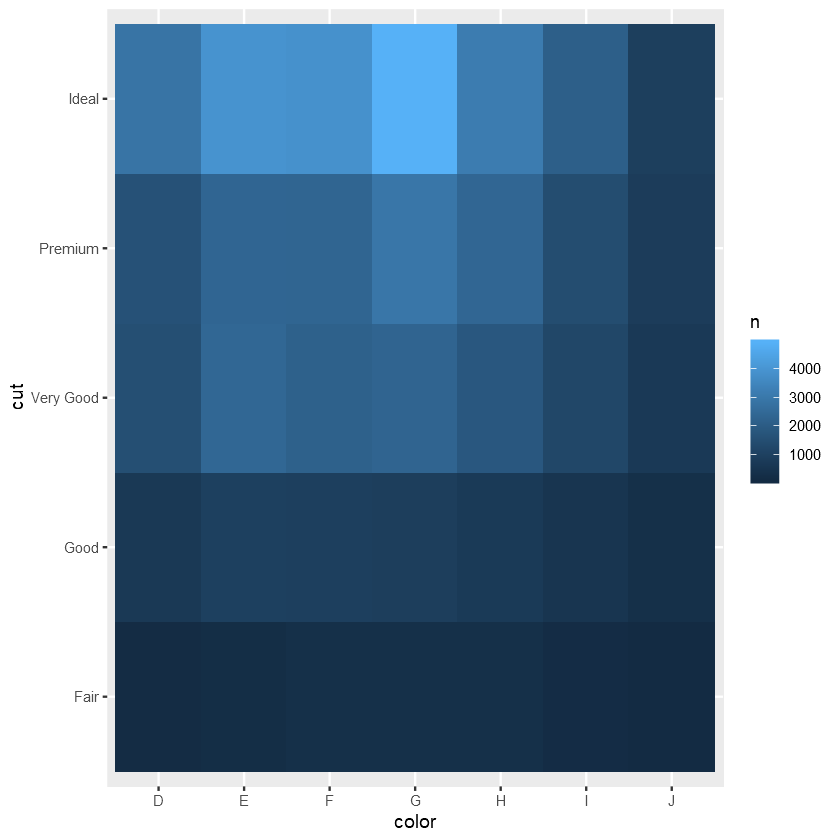

In [5]:
diamonds %>% 
  count(color, cut) %>%  
  ggplot(mapping = aes(x = color, y = cut)) +
  geom_tile(mapping = aes(fill = n))

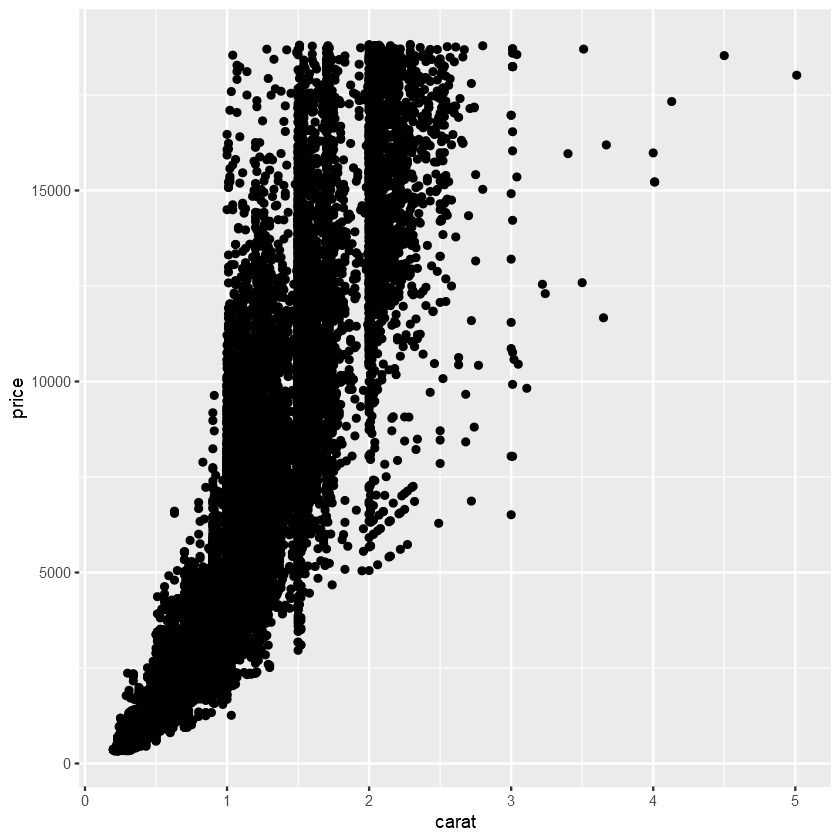

In [6]:
ggplot(data = diamonds) +
  geom_point(mapping = aes(x = carat, y = price))

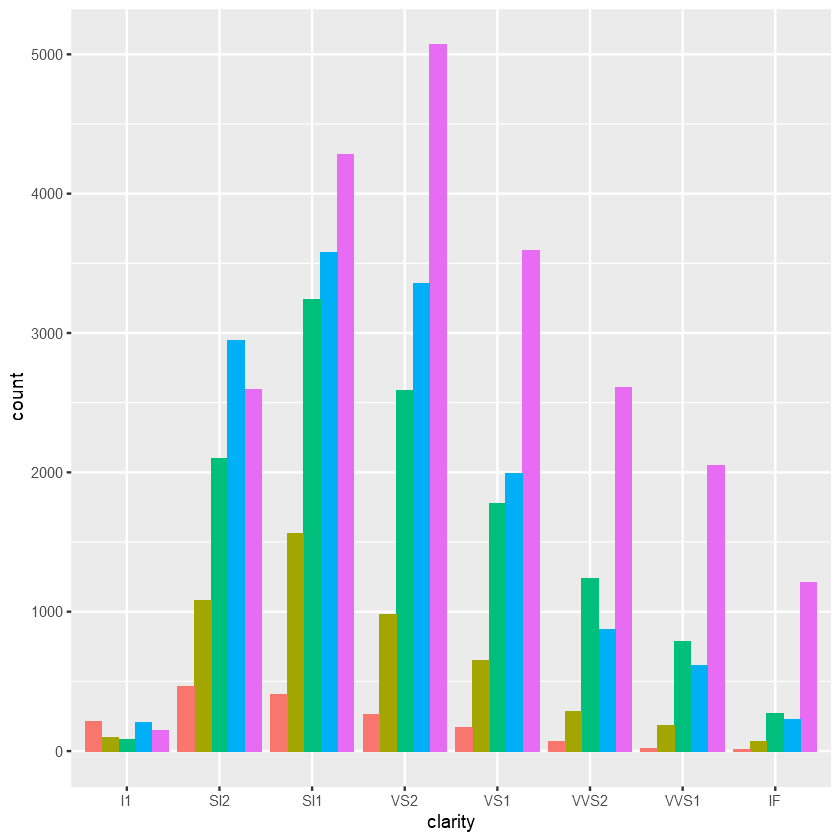

In [7]:
ggplot(diamonds, aes(x=clarity, fill=cut)) + 
  geom_bar(position="dodge") + 
  theme(legend.position="NULL")

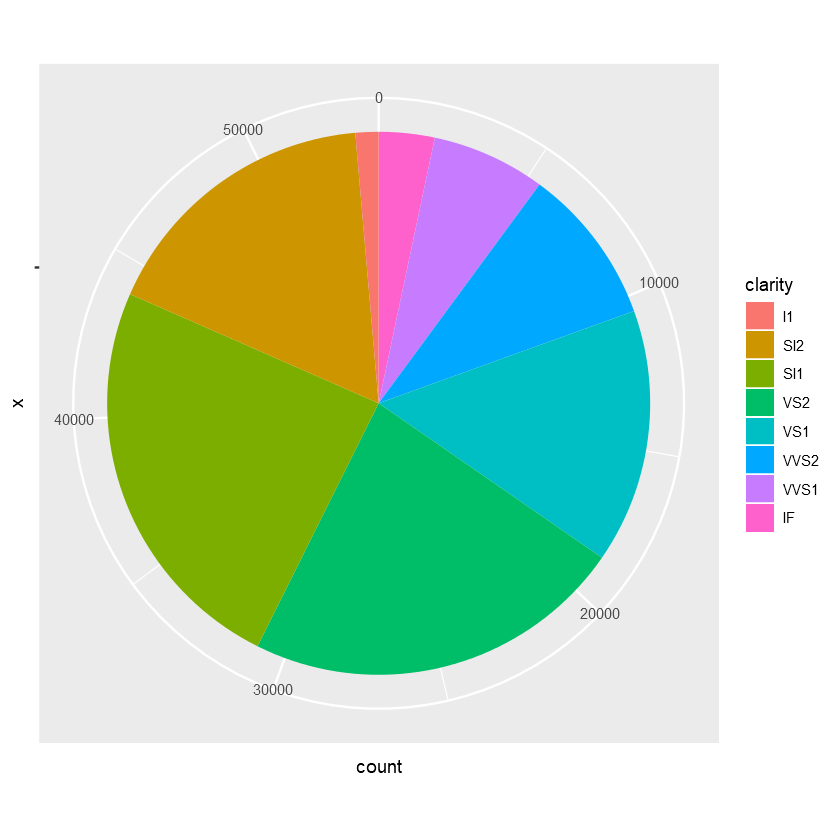

In [8]:
ggplot(diamonds, aes(x="", fill=clarity)) + 
  geom_bar() + 
  coord_polar(theta = "y") 

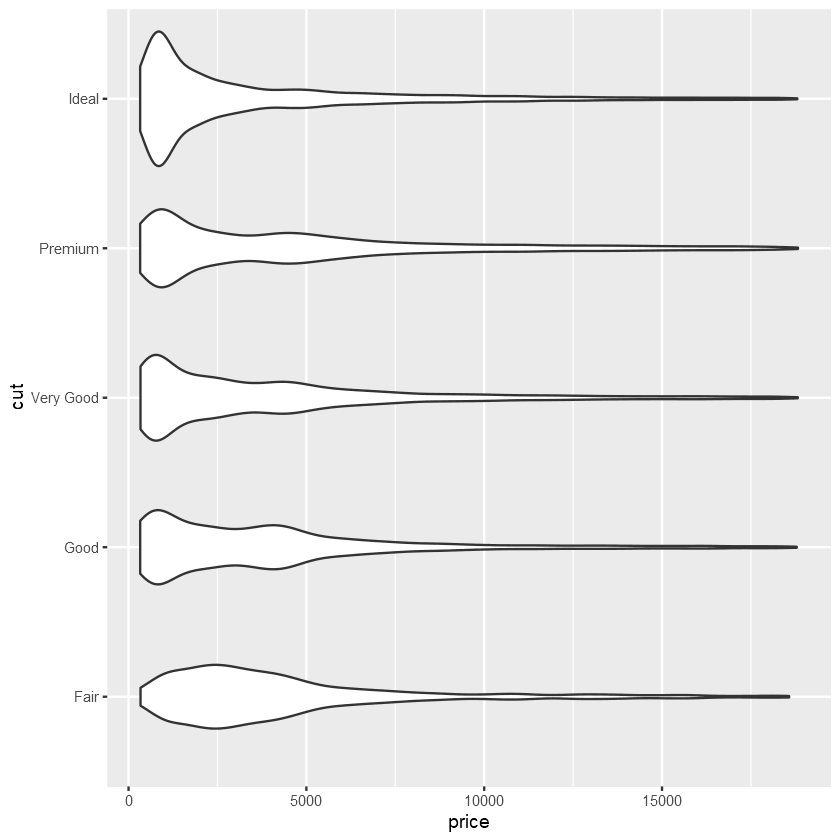

In [9]:
ggplot(data = diamonds, mapping = aes(x = cut, y = price)) +
  geom_violin() +
  coord_flip()

In [24]:
p1 <- ggplot(diamonds, aes(x = Sale_Price, color = Overall_Qual)) +
  geom_freqpoly() +
  scale_x_log10(breaks = c(50, 150, 400, 750) * 1000, labels = scales::dollar)

p2 <- ggplot(diamonds, aes(x = Sale_Price, color = Overall_Qual, fill = Overall_Qual)) +
  geom_density(alpha = .15) +
  scale_x_log10(breaks = c(50, 150, 400, 750) * 1000, labels = scales::dollar)

gridExtra::grid.arrange(p1, p2, nrow = 2)

ERROR: Error in FUN(X[[i]], ...): objet 'Overall_Qual' introuvable


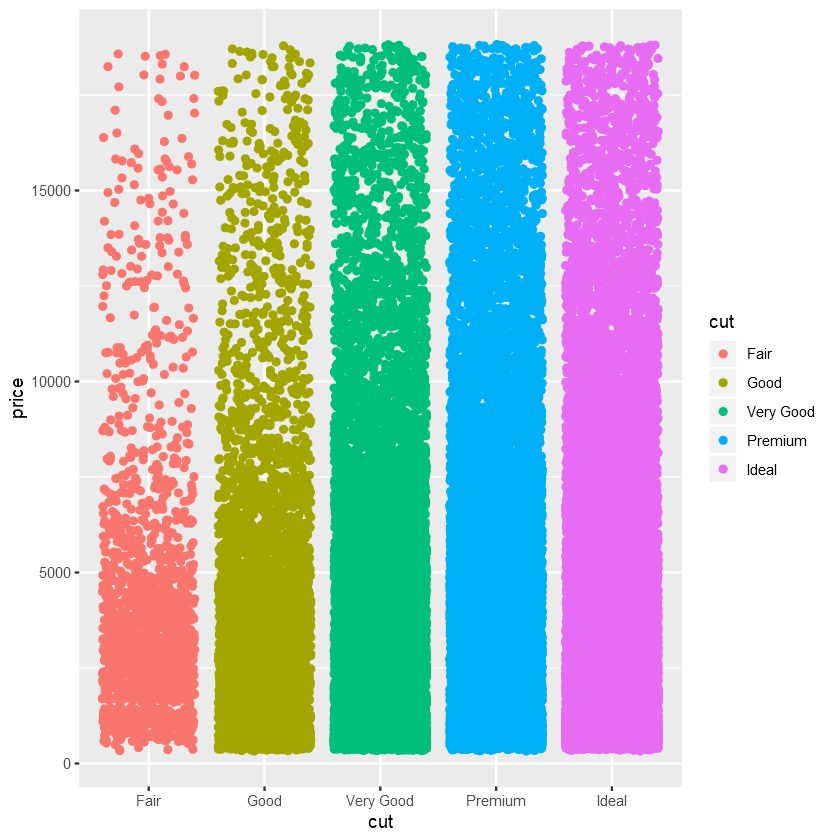

In [12]:
ggplot(data=diamonds,aes(x=cut,y=price,color=cut)) + 
  geom_point(position = "jitter")

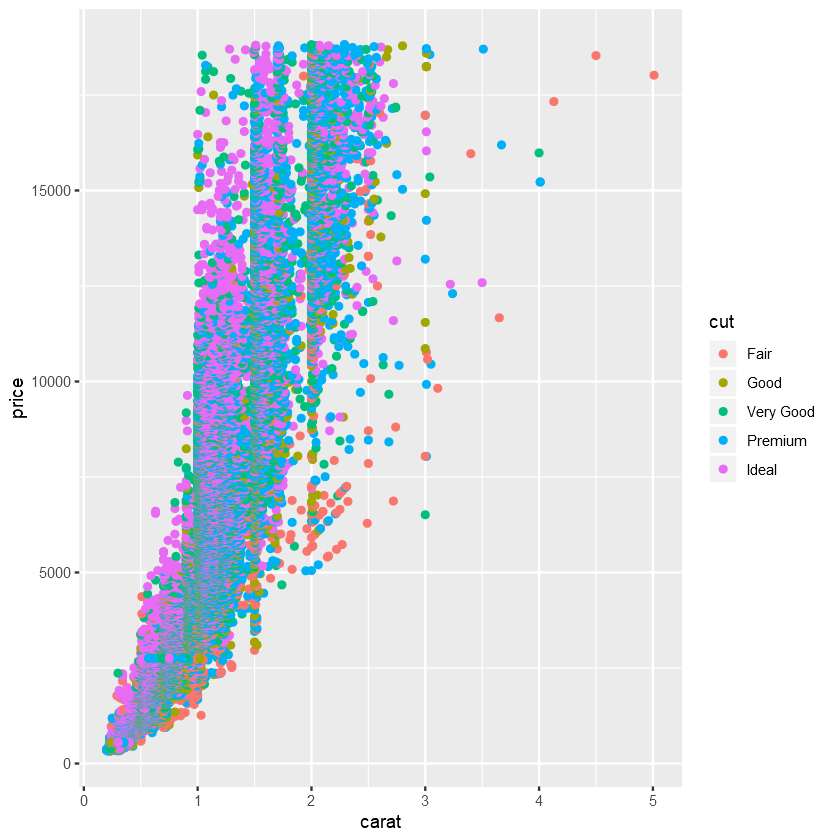

In [13]:
ggplot(diamonds, aes(x=carat, y=price)) + 
  geom_point(aes(color= cut))

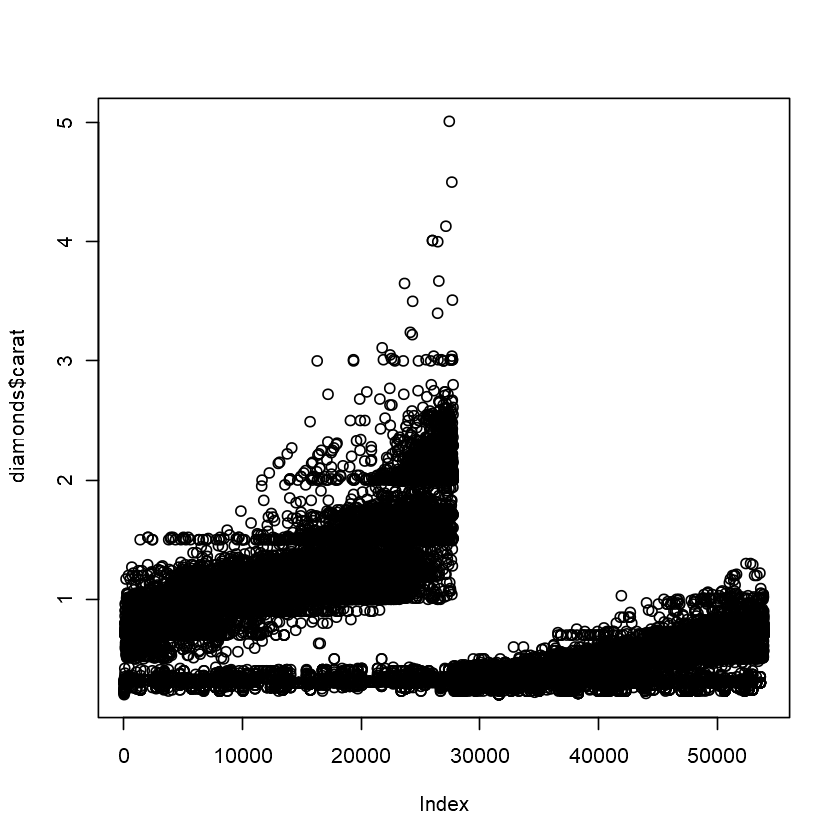

In [33]:
plot(diamonds$carat)

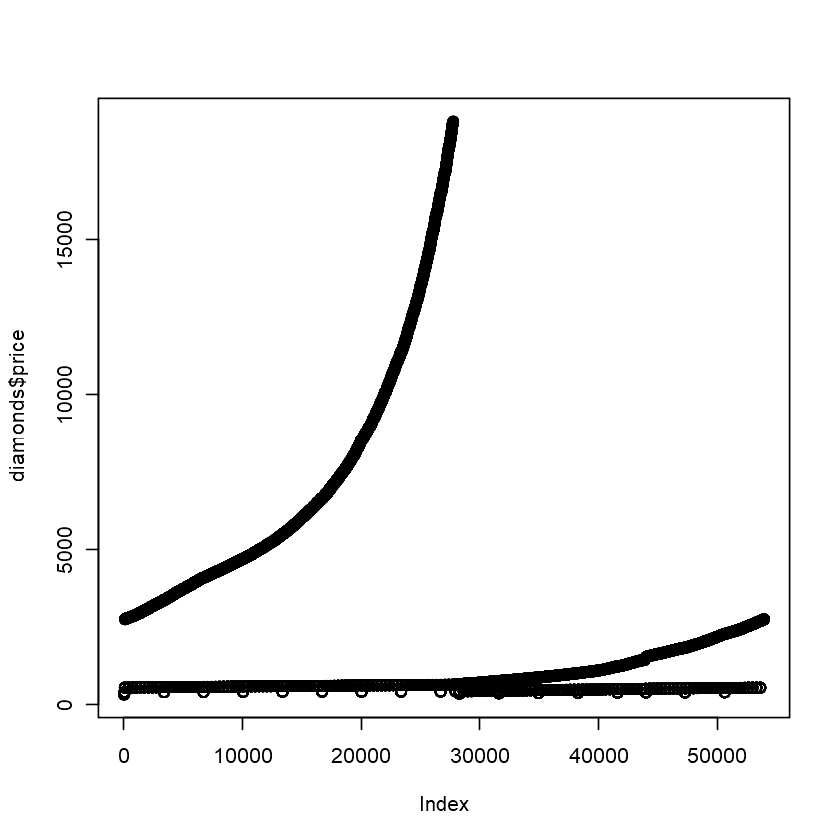

In [34]:
plot(diamonds$price)

#### carat vs price

Warning message:
"Removed 926 rows containing non-finite values (stat_smooth)."Warning message:
"Removed 926 rows containing missing values (geom_point)."Warning message:
"Removed 4 rows containing missing values (geom_smooth)."

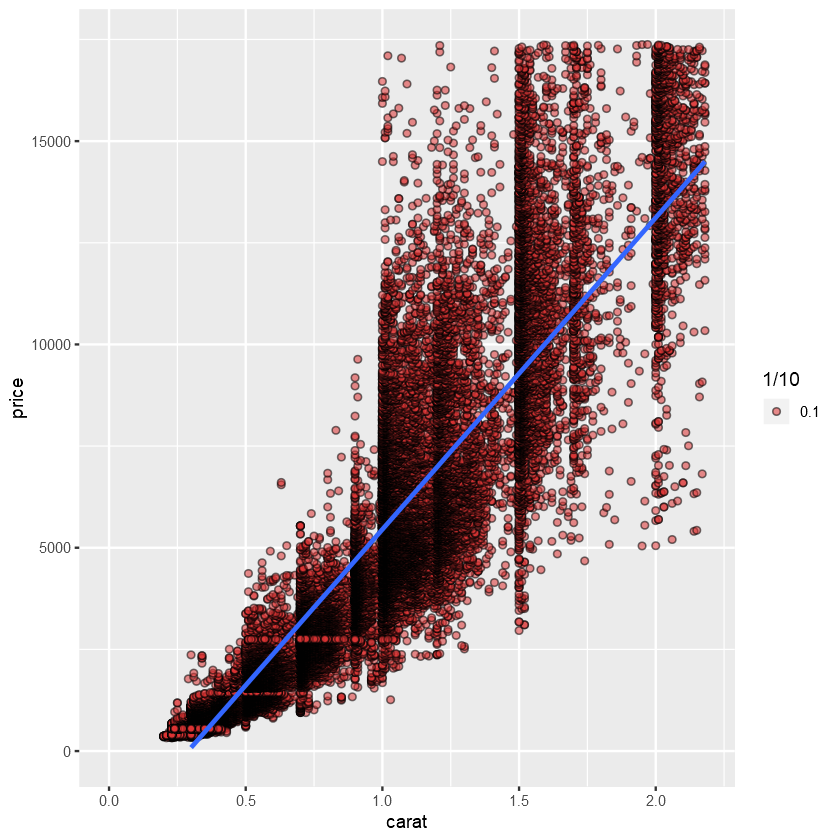

In [36]:
ggplot(data=diamonds, aes(x=carat, y=price)) +
  scale_x_continuous(lim=c(0,quantile(diamonds$carat,0.99))) +
  scale_y_continuous(lim=c(0,quantile(diamonds$price,0.99))) +
  geom_point(fill=I('#dd3333'), color= I("black"), aes(alpha=1/10),shape=21) +
  stat_smooth(method='lm')

Source : https://rpubs.com/taylorwhite/diamondPricing

In [37]:
grid1 <- diamonds2 %>%
  data_grid(carat = seq_range(carat, 20)) %>%
  mutate(lcarat = log2(carat)) %>%
  add_predictions(model_diamonds1, "lprice") %>%
  mutate(price = 2 ^ lprice)

ggplot(diamonds2, aes(carat, price)) + geom_hex(bins = 50) + geom_line(data = grid, color = "green", size = 1)

ERROR: Error in eval(lhs, parent, parent): objet 'diamonds2' introuvable


### Valeurs manquantes & Nan

In [31]:
sum(is.na(diamonds))

[1] 0

## Création des échantillons de test et d'entraînement

In [25]:
# On crée un échantillon de test et un échantillon d'entraînement : 
coeff = 0.8
train <- sample(seq_len(nrow(diamonds)), size = coeff * nrow(diamonds))
diam_train <- diamonds[train, ]
diam_test <- diamonds[-train, ]
install.packages("caret", dependencies = c("Depends", "Suggests"))


package 'caret' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\utilisateur\AppData\Local\Temp\RtmpwVED9D\downloaded_packages


In [26]:
model_train <- lm(data = diam_train, 
                     price ~ carat + cut + color + clarity + depth + table + x + y +  z)

In [27]:
diam_test$price_pred <- predict(model_train, newdata = diam_test)

In [28]:
diam_test %>% mutate(error_squared = abs(price_pred - price)) %>% 
  summarise_at(vars(error_squared), 
               list(moy = mean, min = min, med = median, max = max, sd = sd), na.rm = T)

moy,min,med,max,sd
745.5658,0.0431055,528.1119,15163.79,871.6347


### validation croisée

In [29]:
train.control <- caret::trainControl(method = "cv", number = 10)

### Entraînement du modèle

In [30]:
model_cv <- caret::train(price ~ carat + cut + color + clarity + depth + table + x + y +  z, 
                         data = diamonds, 
                         na.action  = na.pass,
                         method = "lm",
                         trControl = train.control)

Warning message:
"package 'caret' was built under R version 3.6.2"

### 10-fold cross-validation

In [43]:
# Fit lm model using 10-fold CV: model
model <- train(
  price~., diamonds,
  method = "lm",
  trControl = trainControl(
    method = "cv", number = 10,
    verboseIter = TRUE
  )
)

+ Fold01: intercept=TRUE 
- Fold01: intercept=TRUE 
+ Fold02: intercept=TRUE 
- Fold02: intercept=TRUE 
+ Fold03: intercept=TRUE 
- Fold03: intercept=TRUE 
+ Fold04: intercept=TRUE 
- Fold04: intercept=TRUE 
+ Fold05: intercept=TRUE 
- Fold05: intercept=TRUE 
+ Fold06: intercept=TRUE 
- Fold06: intercept=TRUE 
+ Fold07: intercept=TRUE 
- Fold07: intercept=TRUE 
+ Fold08: intercept=TRUE 
- Fold08: intercept=TRUE 
+ Fold09: intercept=TRUE 
- Fold09: intercept=TRUE 
+ Fold10: intercept=TRUE 
- Fold10: intercept=TRUE 
Aggregating results
Fitting final model on full training set


In [44]:
model

Linear Regression 

53940 samples
    9 predictor

No pre-processing
Resampling: Cross-Validated (10 fold) 
Summary of sample sizes: 48546, 48546, 48547, 48546, 48547, 48546, ... 
Resampling results:

  RMSE      Rsquared  MAE   
  1130.711  0.919661  740.57

Tuning parameter 'intercept' was held constant at a value of TRUE

### predict

In [45]:
# Predict on full Boston dataset
p<-predict(model,diamonds)
p

1             2             3             4             5 
-1.346364e+03 -6.645954e+02  2.111071e+02 -8.307372e+02 -3.459224e+03 
            6             7             8             9            10 
-1.380488e+03 -3.978752e+02 -1.073324e+03 -1.040023e+03 -4.204179e+02 
           11            12            13            14            15 
-2.483077e+03 -1.722362e+03 -6.449648e+02 -3.037866e+03 -1.690081e+03 
           16            17            18            19            20 
-3.589583e+03 -2.192976e+03 -2.396554e+03 -2.475814e+03 -2.315252e+03 
           21            22            23            24            25 
-2.533507e+03  6.313333e+01 -3.579828e+02 -2.249489e+03 -2.215066e+03 
           26            27            28            29            30 
 4.947033e+02 -8.251858e+02 -1.699440e+03  2.175483e+02  3.354325e+02 
           31            32            33            34            35 
 3.534131e+02  3.256309e+02  3.490909e+02  4.132846e+02  5.570459e+02 
           36            37            38            39            40 
 2.102743e+02  1.227333e+02 -9.959463e+02  4.134710e+02 -2.053845e+03 
           41            42            43            44            45 
-2.040628e+03 -1.974535e+03  2.004159e+02  5.681327e+02 -1.891621e+03 
           46            47            48            49            50 
-2.801426e+02 -1.642766e+03 -1.958360e+03  3.461620e+01 -2.019466e+03 
           51            52            53            54            55 
-6.324348e+02  2.768539e+02 -1.103054e+03 -3.056476e+01  2.444920e+02 
           56            57            58            59            60 
-2.249048e+03 -3.297038e+03 -1.393505e+03 -1.450895e+03 -1.527279e+03 
           61            62            63            64            65 
 1.939593e+00  7.572325e+01  1.443011e+02  1.868123e+02 -1.496485e+03 
           66            67            68            69            70 
 9.245037e+02  2.205222e+02 -4.248695e+02 -3.377402e+02  9.117166e+02 
           71            72            73            74            75 
 1.021021e+03 -9.548860e+02 -9.753890e+02 -9.064037e+02 -1.157691e+03 
           76            77            78            79            80 
 8.414078e+02  9.528516e+02  1.175462e+03  1.062408e+03  8.984395e+02 
           81            82            83            84            85 
 9.074098e+02  1.144525e+03  9.954994e+02 -1.669004e+03  8.700505e+02 
           86            87            88            89            90 
 5.691694e+02  1.079923e+02  9.734241e+01  2.222105e+01 -1.281973e+03 
           91            92            93            94            95 
 2.985674e+03  2.397641e+03  3.401432e+03  3.621009e+03  2.370645e+03 
           96            97            98            99           100 
 3.486835e+03  3.645954e+03  3.080563e+03  3.152231e+03  3.032064e+03 
          101           102           103           104           105 
 3.528774e+03  3.422400e+03  3.172827e+03  3.679588e+03  3.520064e+03 
          106           107           108           109           110 
 3.174049e+03  3.476030e+03  3.458160e+03  2.992012e+03  3.448483e+03 
          111           112           113           114           115 
 2.890468e+03  2.416504e+03  3.977558e+03  2.992807e+03  3.809603e+03 
          116           117           118           119           120 
 3.851490e+03  2.752841e+03  3.492595e+03  3.649948e+03  2.885994e+03 
          121           122           123           124           125 
 2.353677e+03  3.425862e+03  3.374211e+03  2.691913e+03  2.629791e+03 
          126           127           128           129           130 
 3.485602e+03  4.207049e+03  3.698256e+03  2.233587e+03  2.149915e+03 
          131           132           133           134           135 
 3.468910e+03  3.163180e+03  3.304785e+03  3.477486e+03  3.624693e+03 
          136           137           138           139           140 
 3.681749e+03  3.827732e+03  3.880566e+03  2.791226e+03  3.621263e+03 
          141           142         

## Liens

* https://rstudio-pubs-static.s3.amazonaws.com/400929_1fe468939a9c4d9c8cf8e8768ab5fb3c.html
* https://rstudio-pubs-static.s3.amazonaws.com/443937_b6d1e8c589c248bdaa2ccbcc44ae3a1d.html